In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from onboard_detector_processor import oboardDetectorProcessor
from onboard_prototype_utils import load_data, plot
import torch
from matplotlib.patches import Rectangle
from datasets.data_utils import get_data_loader
import matplotlib.pyplot as plt

In [3]:
data = load_data(r"C:\Users\meoni\Documents\ESA\Projects\END2END\onboard_prototype\my_dir")

In [44]:
detector_number="9"
data_dn = data["Etna_00"][1][detector_number]
onboard_processor=oboardDetectorProcessor("S2B", detector_number )#in_shape=data_dn[list(data_dn.keys())[0]].shape
onboard_processor.load_model(r"C:\Users\meoni\Documents\ESA\Projects\END2END\MSMatch\checkpoint\thraws_swir_train\FixMatch_archefficientnet-lite0_batch8_confidence0.95_lr0.03_uratio4_wd0.00075_wu1.0_seed0_numlabels800_optSGD\model_best.pth")
onboard_processor.ai_model.eval()
y_list=[]
x_coreg_list=[]

data_range=[list(data_dn.keys())[::-1] if not(int(detector_number) % 2) else list(data_dn.keys())]
for granule_number in data_range[0]:
    y,x_coreg=onboard_processor.process(data_dn[granule_number]/255)
    y_list.append(y)
    x_coreg_list.append(x_coreg)

Using not pretrained model efficientnet-lite0 ...


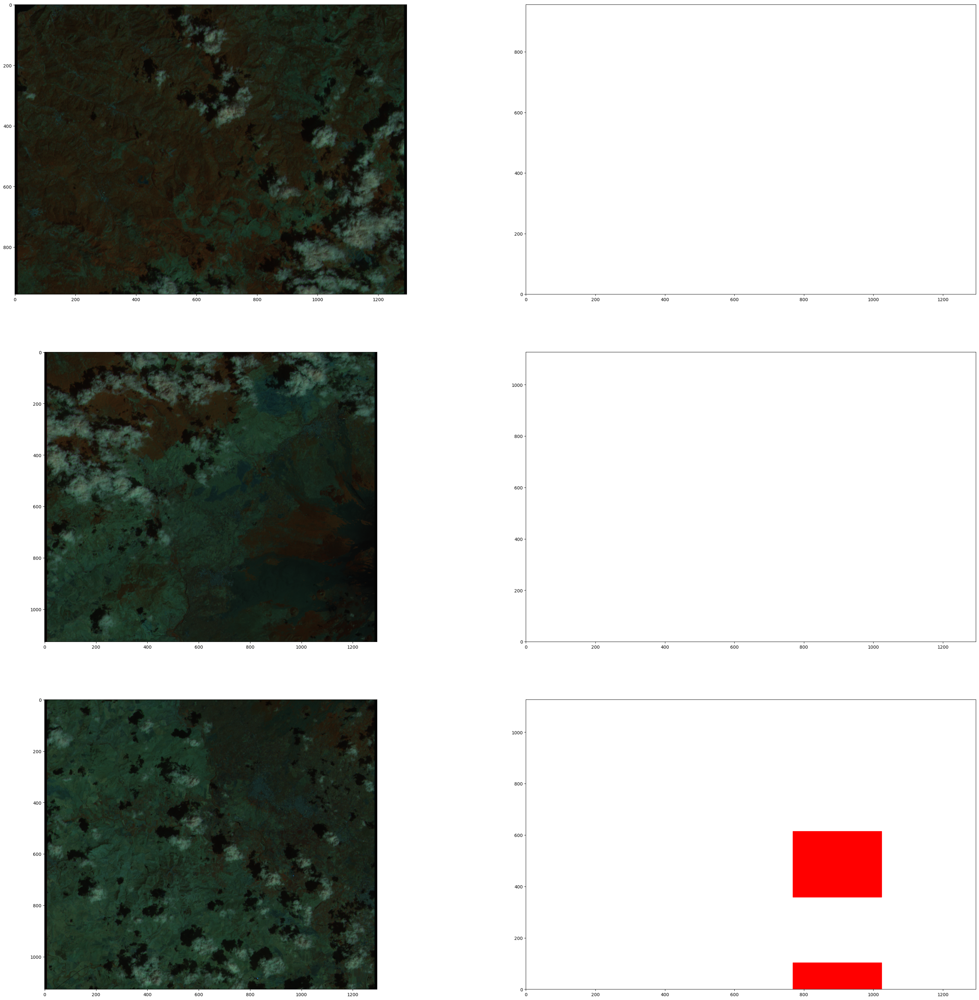

In [45]:
fig, ax=plt.subplots(3,2, figsize=(40,40))

for n in range(3):
    x=x_coreg_list[n]
    y=y_list[n]
    plot(x,x_max=1, ax=ax[n,0])

    #x_map=torch.zeros([x.shape[1], x.shape[2], 3])
    ax[n,1].set_xlim(0, x.shape[2])
    ax[n,1].set_ylim(0, x.shape[1])
    patch_list=[]
    for h in range(y.shape[1]):
        for v in range(y.shape[0]):
            if y[v,h] == 0:
                patch_list.append(Rectangle((h * 256,x.shape[1] - v * 256), 256, -256, color='red'))
    for patch in patch_list:
        ax[n,1].add_patch(patch)
    

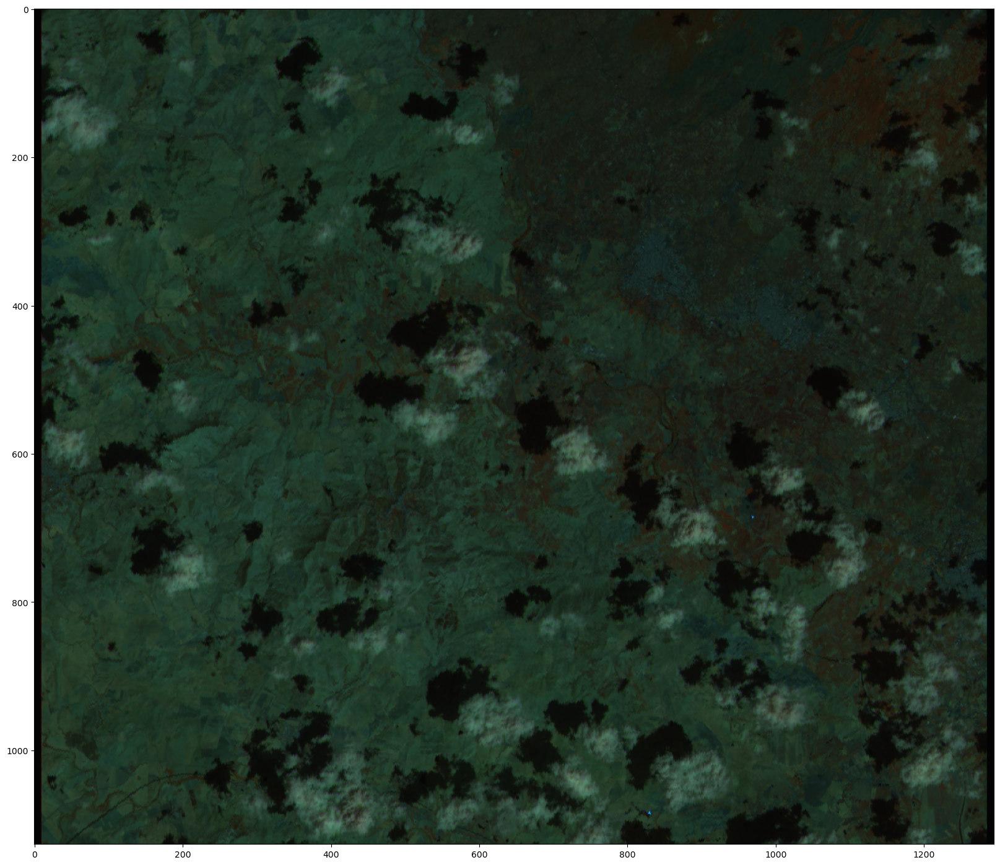

In [46]:
plt.figure(figsize=(20,20))
plot(x_coreg_list[2], x_max=1)